In [2]:
import cv2
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display
import numpy as np
import argparse
import random as rng
from datetime import datetime

In [3]:
num_superpixels = 2  # desired number of superpixels
num_iterations = 4     # number of pixel level iterations. The higher, the better quality
prior = 2              # for shape smoothing term. must be [0, 5]
num_levels = 4
num_histogram_bins = 5 # number of histogram bins

In [4]:
# 원본 이미지
image = cv2.imread('./아웃포커싱/샘플1.jpg')

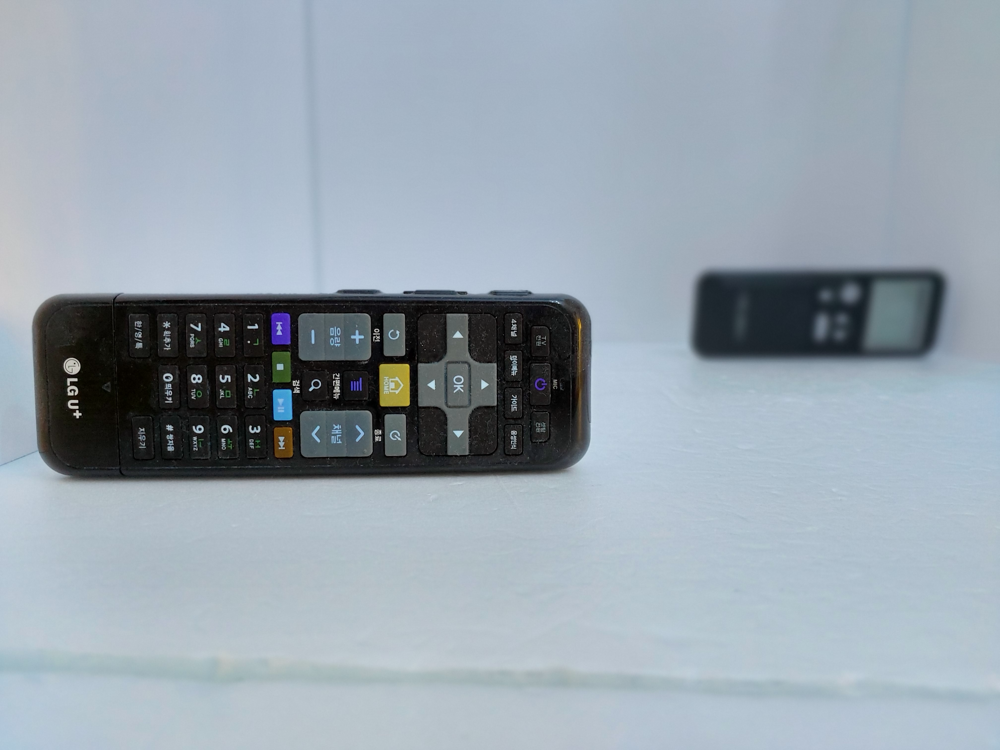

In [6]:


# 사용자가 크롭한 영역의 이미지로 사본 생성.
# 일반적으로는 원본 이미지 + 크롭 영역 마스크를 쓰는데, 버섯 이미지 특성상 정확도가 떨어짐
# 부득이하게 크롭 이미지 + 크롭 영역 마스크를 사용
img = image.copy()

display(Image.fromarray(img)) # 이미지1: 원본 이미지

mask = np.zeros(img.shape[:2],np.uint8) # 크롭 이미지와 동일한 크기의 mask 생성

In [7]:
# rect - It is the coordinates of a rectangle which includes the foreground object in the format (x,y,w,h)
rect = (136,1154,2256,780) # RoI는 크롭 이미지와 동일한 크기로 임의 할당

In [8]:
bgdModel = np.zeros((1, 65), np.float64) # 배경 모델 무조건 1행 65열, float64
fgdModel = np.zeros((1, 65), np.float64) # 전경 모델 무조건 1행 65열, float64

print(datetime.now())

2022-10-28 00:13:00.234220


In [9]:
cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[ 3.03256598e-01,  2.39192939e-02,  3.27044909e-01,
          2.71424461e-01,  7.43547374e-02,  1.62461915e+02,
          1.75867220e+02,  1.90046607e+02,  3.81615909e+01,
          4.80750187e+01,  5.58010541e+01,  1.83352667e+02,
          1.96872373e+02,  2.07838073e+02,  1.75703968e+02,
          1.89467757e+02,  2.01330587e+02,  1.49480793e+02,
          1.65971501e+02,  1.75232605e+02,  2.05977897e+01,
          2.43118794e+01,  3.17365014e+01,  2.43118794e+01,
          3.34466341e+01,  4.36466262e+01,  3.17365014e+01,
          4.36466262e+01,  6.12402911e+01,  1.66697914e+02,
          1.73606125e+02,  1.77323415e+02,  1.73606125e+02,
          1.82364306e+02,  1.85530199e+02,  1.77323415e+02,
          1.85530199e+02,  1.90345995e+02,  1.41833803

In [10]:
# GrabCut 알고리즘 수행
# img: 입력 영상. 8비트 3채널.
# mask: 입출력 마스크. cv2.GC_BGD(0), cv2.GC_FGD(1), cv2.GC_PR_BGD(2), cv2.GC_PR_FGD(3) 네 개의 값으로 구성됨. cv2.GC_INIT_WITH_RECT 모드로 초기화.
# rect: ROI 영역. cv2.GC_INIT_WITH_RECT 모드에서만 사용됨
# bgdModel: 임시 배경 모델 행렬. 같은 영상 처리 시에는 변경 금지.
# fgdModel: 임시 전경 모델 행렬. 같은 영상 처리 시에는 변경 금지.
# iterCount: 결과 생성을 위한 반복 횟수.
# mode: cv2.GC_로 시작하는 모드 상수. 보통 cv2.GC_INIT_WITH_RECT 모드로 초기화하고, cv2.GC_INIT_WITH_MASK 모드로 업데이트함.


print(datetime.now())

# grabCut 자료에서 0,2는 배경, 1,3은 전경.
# mask == 0 or mask == 2를 만족하면 0으로 설정 아니면 1로 설정.
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')

print(datetime.now())

# np.newaxis로 차원 확장
dst = img * mask2[:,:,np.newaxis]
print(datetime.now())

2022-10-28 00:13:44.009005
2022-10-28 00:13:44.034060
2022-10-28 00:13:44.081274


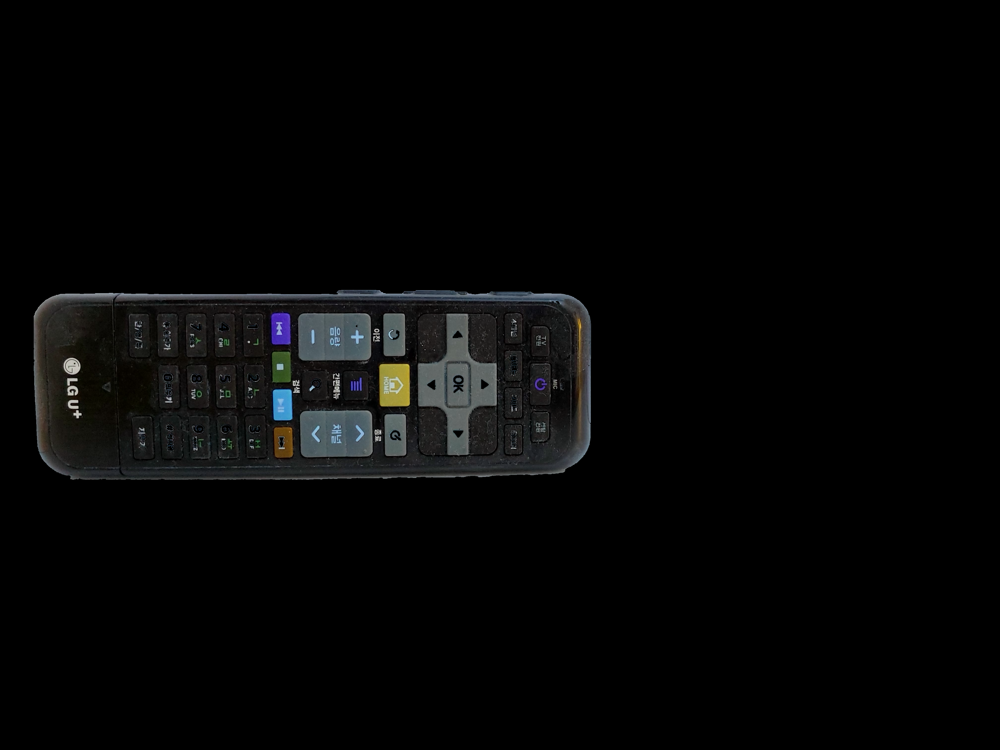

In [11]:
display(Image.fromarray(dst)) # 이미지2: Mask 입혀서 전경 영역만 추출한 이미지

2022-10-28 00:14:00.818902


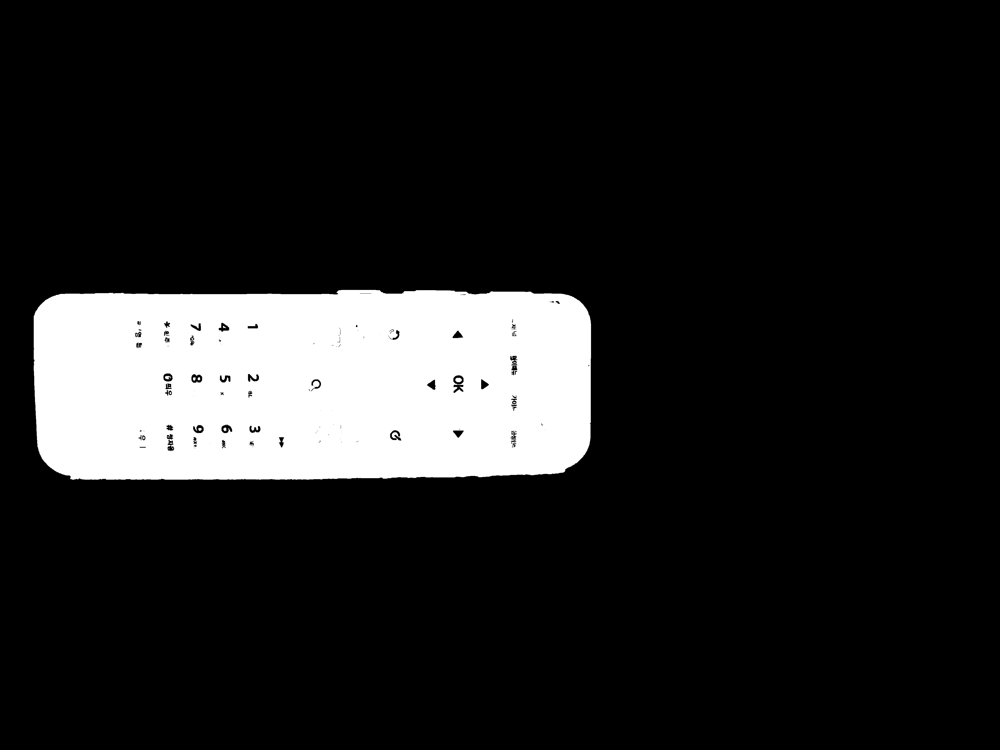

In [12]:
mask3 = np.where((mask==2)|(mask==0),0,255).astype('uint8')
print(datetime.now())
display(Image.fromarray(mask3)) # 이미지3: 흑백 Mask 이미지

2022-10-28 00:14:05.941495
2022-10-28 00:14:05.941707
2022-10-28 00:14:05.942444


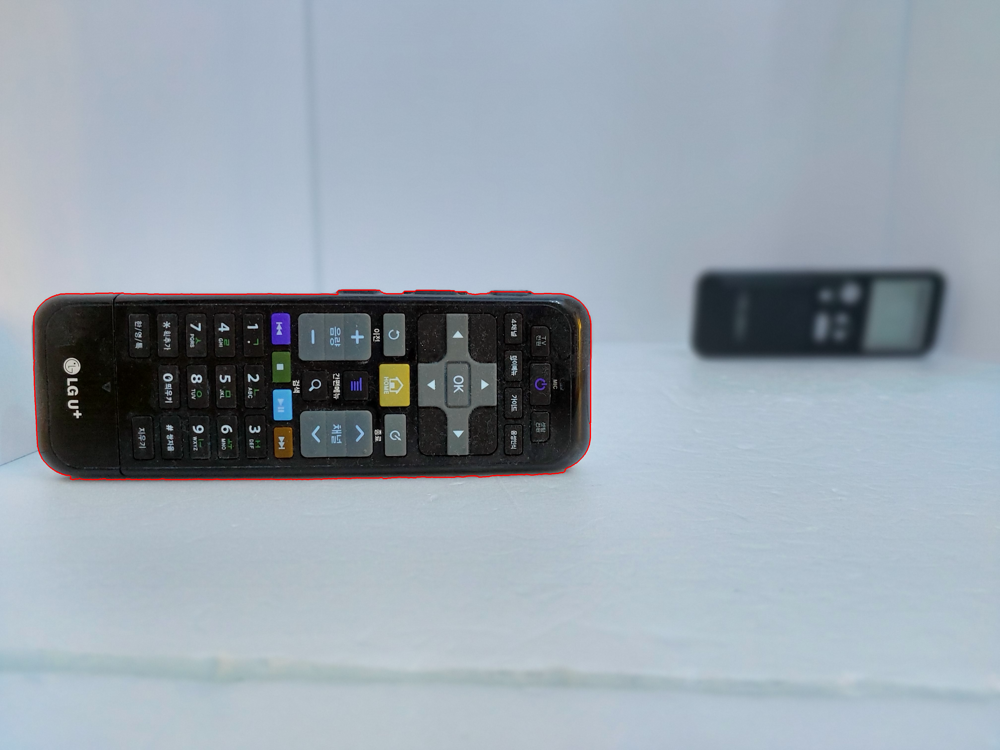

[[[1376 1169]]

 [[1375 1170]]

 [[1367 1170]]

 ...

 [[1530 1170]]

 [[1517 1170]]

 [[1516 1169]]]


In [13]:
# 흑백 Mask에서 외곽선 추출 후, 그 중 가장 큰 외곽선 하나만 그림
contours, _ = cv2.findContours(mask2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print(datetime.now())
max_contour = max(contours, key=cv2.contourArea) 
print(datetime.now())
cv2.drawContours(img, [max_contour], 0, (255, 0, 0), 3)
print(datetime.now())
display(Image.fromarray(img)) # 이미지4: 원본 이미지에 외곽선만 그린 이미지
print(max_contour)
                

